In [2]:
import json
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier, KernelDensity
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV,StratifiedShuffleSplit,train_test_split
from sklearn.metrics import accuracy_score

from shared.database_organizer import DatabaseOrganizer
from shared.auto_trainer import MajoritaryVoteClassifier,execute_grid_search,load_default_dict
from shared.metrics import FoldMetrics, compute_metrics_for_model
from scipy import stats



# GridSearch

In [2]:

organizer = DatabaseOrganizer(training_number=1)
current_seed = organizer.get_current_seed()
classifier_names = ["LogisticRegression", "KNeighborsClassifier", "QuadraticDiscriminantAnalysis", "KernelDensity"]
datasets = organizer.get_datasets(organizer.get_current_seed())
params_json ={}
for classifier_name in classifier_names:
    params_json[classifier_name] = {}

# Print resumo dos datasets
for dataset_name, dataset in datasets.items():
    print(f"Dataset: {dataset_name}")
    print(f" - Train size: {dataset[0]['train']['X'].shape[0]} rows, {dataset[0]['train']['X'].shape[1]} columns")
    X_train = datasets[dataset_name][0]['train']['X']
    y_train = datasets[dataset_name][0]['train']['y']
    
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2)
    for train_index, val_index in sss.split(X_train, y_train):
        gridsearch_X_train, gridsearch_X_val = X_train[train_index], X_train[val_index]
        gridsearch_y_train, gridsearch_y_val = y_train[train_index], y_train[val_index]

    for classifier_name in classifier_names:
        best_params = execute_grid_search(classifier_name,x_val=gridsearch_X_val,y_val=gridsearch_y_val,warnings_flag=False)
        params_json[classifier_name][dataset_name] = best_params

metrics = json.dumps(params_json, default= lambda obj :obj.__dict__ )
with open("utils/gridsearchlogisticregression.json", "w") as outfile:
    outfile.write(metrics)



Dataset: fac
 - Train size: 1800 rows, 216 columns
Running seach in LogisticRegression classifier with the following params: {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'penalty': ['l1', 'l2', 'elasticnet'], 'solver': ['liblinear'], 'max_iter': [100, 200, 500, 1000]}
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best regularization parameter: {'C': 10, 'max_iter': 200, 'penalty': 'l1', 'solver': 'liblinear'}
Dataset: fou
 - Train size: 1800 rows, 76 columns
Running seach in LogisticRegression classifier with the following params: {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'penalty': ['l1', 'l2', 'elasticnet'], 'solver': ['liblinear'], 'max_iter': [100, 200, 500, 1000]}
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best regularization parameter: {'C': 100, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Dataset: zer
 - Train size: 1800 rows, 47 columns
Running seach in LogisticRegression classifier with the following params: {'C': [0.001, 0.01, 

In [2]:
with open("utils/gridsearch.json",'r') as outfile:
    params = json.load(outfile)
    for classifier_name in list(params.keys()):
        for dataset_name in params[classifier_name]:
            print(f"{classifier_name} classifier on {dataset_name} dataset: {params[classifier_name][dataset_name]}")



LogisticRegression classifier on fac dataset: {'C': 10, 'penalty': 'l1', 'max_iter': 200, 'solver': 'liblinear'}
LogisticRegression classifier on fou dataset: {'C': 10, 'penalty': 'l2', 'max_iter': 200, 'solver': 'liblinear'}
LogisticRegression classifier on zer dataset: {'C': 0.001, 'penalty': 'l2', 'max_iter': 200, 'solver': 'liblinear'}
KNeighborsClassifier classifier on fac dataset: {'n_neighbors': 4}
KNeighborsClassifier classifier on fou dataset: {'n_neighbors': 5}
KNeighborsClassifier classifier on zer dataset: {'n_neighbors': 5}
QuadraticDiscriminantAnalysis classifier on fac dataset: {'reg_param': 1}
QuadraticDiscriminantAnalysis classifier on fou dataset: {'reg_param': 0.001}
QuadraticDiscriminantAnalysis classifier on zer dataset: {'reg_param': 1}
KernelDensity classifier on fac dataset: {'bandwidth': 26.06079243154136, 'kernel': 'gaussian'}
KernelDensity classifier on fou dataset: {'bandwidth': 0.03535968683163703, 'kernel': 'gaussian'}
KernelDensity classifier on zer datas

# Trainning

In [3]:
numero_de_treinamentos = 30
execution_metrics: "list[list[FoldMetrics]]" = []
with open("utils/gridsearch.json",'r') as outfile:
    params = json.load(outfile)

predictions = []
for i in range(numero_de_treinamentos):
    predictions.append([])
    organizer = DatabaseOrganizer(training_number=i)
    current_seed = organizer.get_current_seed()
    print(f"Training {i+1}/{numero_de_treinamentos}")
    print(f"Current seed: {current_seed}")
    
    datasets = organizer.get_datasets(organizer.get_current_seed())
    
    # Print resumo dos datasets
    for dataset_name, dataset in datasets.items():
        print(f"Dataset: {dataset_name}")
    
    execution_metrics.append([])

    # Iteramos sobre cada fold
    for fold in range(10):
        predictions[i].append([])
        print(f"Fold Number: {fold}")
        print(f" - Train size: {dataset[fold]['train']['X'].shape[0]} rows, {dataset[fold]['train']['X'].shape[1]} columns")
        print(f" - Test size: {dataset[fold]['test']['X'].shape[0]} rows, {dataset[fold]['test']['X'].shape[1]} columns")
        
        X_train_fac = datasets['fac'][fold]['train']['X']
        y_train_fac = datasets['fac'][fold]['train']['y']
        
        X_train_fou = datasets['fou'][fold]['train']['X']
        y_train_fou = datasets['fou'][fold]['train']['y']

        X_train_zer = datasets['zer'][fold]['train']['X']
        y_train_zer = datasets['zer'][fold]['train']['y']
        
        # Treinamento
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")
            bayesian_gaussian_fac = QuadraticDiscriminantAnalysis(**params['QuadraticDiscriminantAnalysis']['fac']).fit(X_train_fac, y_train_fac)
        bayesian_gaussian_fou = QuadraticDiscriminantAnalysis(**params['QuadraticDiscriminantAnalysis']['fou']).fit(X_train_fou, y_train_fou)
        bayesian_gaussian_zer = QuadraticDiscriminantAnalysis(**params['QuadraticDiscriminantAnalysis']['zer']).fit(X_train_zer, y_train_zer)

        bayesian_knn_fac = KNeighborsClassifier(algorithm="auto", metric="euclidean", weights="distance", n_jobs=-1,**params['KNeighborsClassifier']['fac']).fit(X_train_fac, y_train_fac)
        bayesian_knn_fou = KNeighborsClassifier(algorithm="auto", metric="euclidean", weights="distance", n_jobs=-1,**params['KNeighborsClassifier']['fou']).fit(X_train_fou, y_train_fou)
        bayesian_knn_zer = KNeighborsClassifier(algorithm="auto", metric="euclidean", weights="distance", n_jobs=-1,**params['KNeighborsClassifier']['zer']).fit(X_train_zer, y_train_zer)
        ##
        classes = list(range(10))

        kde_models = {}

        for data in ["fac", "fou", "zer"]:
            kde_models[data] = []
        for c in classes:
            X_train_class_fac = X_train_fac[y_train_fac == c]
            X_train_class_fou = X_train_fou[y_train_fou == c]
            X_train_class_zer = X_train_zer[y_train_zer == c]
            bayesian_parzen_fac = KernelDensity(**params['KernelDensity']['fac']).fit(X_train_class_fac)
            bayesian_parzen_fou = KernelDensity(**params['KernelDensity']['fou']).fit(X_train_class_fou)
            bayesian_parzen_zer = KernelDensity(**params['KernelDensity']['zer']).fit(X_train_class_zer)
            kde_models['fac'].append(bayesian_parzen_fac)
            kde_models['fou'].append(bayesian_parzen_fou)
            kde_models['zer'].append(bayesian_parzen_zer)

        # LogisticRegression(max_iter=100, random_state=42, **params)
        logistic_regression_fac = LogisticRegression(random_state=42,**params['LogisticRegression']['fac']).fit(X_train_fac, y_train_fac)
        logistic_regression_fou = LogisticRegression(random_state=42,**params['LogisticRegression']['fou']).fit(X_train_fou, y_train_fou)
        logistic_regression_zer = LogisticRegression(random_state=42,**params['LogisticRegression']['zer']).fit(X_train_zer, y_train_zer)

        # Predições
        X_test_fac = datasets['fac'][fold]['test']['X']
        X_test_fou = datasets['fou'][fold]['test']['X']
        X_test_zer = datasets['zer'][fold]['test']['X']
        # The y_test is the same for all
        y_test = datasets['fac'][fold]['test']['y']

        bayesian_gaussian_fac_predictions = bayesian_gaussian_fac.predict(X_test_fac)
        bayesian_gaussian_fou_predictions = bayesian_gaussian_fou.predict(X_test_fou)
        bayesian_gaussian_zer_predictions = bayesian_gaussian_zer.predict(X_test_zer)

        bayesian_knn_fac_predictions = bayesian_knn_fac.predict(X_test_fac)
        bayesian_knn_fou_predictions = bayesian_knn_fou.predict(X_test_fou)
        bayesian_knn_zer_predictions = bayesian_knn_zer.predict(X_test_zer)

        bayesian_parzen_fac_predictions = np.argmax(np.array([kde.score_samples(X_test_fac) for kde in kde_models['fac']]).T, axis=1)
        bayesian_parzen_fou_predictions = np.argmax(np.array([kde.score_samples(X_test_fou) for kde in kde_models['fou']]).T, axis=1)
        bayesian_parzen_zer_predictions = np.argmax(np.array([kde.score_samples(X_test_zer) for kde in kde_models['zer']]).T, axis=1)

        logistic_regression_fac_predictions = logistic_regression_fac.predict(X_test_fac)
        logistic_regression_fou_predictions = logistic_regression_fou.predict(X_test_fou)
        logistic_regression_zer_predictions = logistic_regression_zer.predict(X_test_zer)

        # Agrupamento (Regra do voto majoritário)
        majoritary_vote_classifier = MajoritaryVoteClassifier(total_classifiers=3, total_examples=200)
        combined_bayesian_gaussian_predictions = majoritary_vote_classifier.classify([
            bayesian_gaussian_fac_predictions,
            bayesian_gaussian_fou_predictions,
            bayesian_gaussian_zer_predictions
        ])
        combined_bayesian_knn_predictions = majoritary_vote_classifier.classify([
            bayesian_knn_fac_predictions,
            bayesian_knn_fou_predictions,
            bayesian_knn_zer_predictions
        ])
        combined_bayesian_parzen_predictions = majoritary_vote_classifier.classify([
            bayesian_parzen_fac_predictions,
            bayesian_parzen_fou_predictions,
            bayesian_parzen_zer_predictions
        ])
        combined_logistic_regression_predictions = majoritary_vote_classifier.classify([
            logistic_regression_fac_predictions,
            logistic_regression_fou_predictions,
            logistic_regression_zer_predictions
        ])
        ## writing metrics dataframe
        predictions[i][fold]= {
            'labels': y_test,
            'bayesian_gaussian_fac': bayesian_gaussian_fac_predictions,
            'bayesian_gaussian_fou': bayesian_gaussian_fou_predictions,
            'bayesian_gaussian_zer': bayesian_gaussian_zer_predictions,
            'combined_bayesian_gaussian': combined_bayesian_gaussian_predictions,
            'bayesian_knn_fac': bayesian_knn_fac_predictions,
            'bayesian_knn_fou': bayesian_knn_fou_predictions,
            'bayesian_knn_zer': bayesian_knn_zer_predictions,  
            'combined_bayesian_knn': combined_bayesian_knn_predictions,
            'bayesian_parzen_fac': bayesian_parzen_fac_predictions,
            'bayesian_parzen_fou': bayesian_parzen_fou_predictions,
            'bayesian_parzen_zer': bayesian_parzen_zer_predictions,
            'combined_bayesian_parzen': combined_bayesian_parzen_predictions,
            'logistic_regression_fac': logistic_regression_fac_predictions,
            'logistic_regression_fou': logistic_regression_fou_predictions,
            'logistic_regression_zer': logistic_regression_zer_predictions,
            'combined_logistic_regression': combined_logistic_regression_predictions
        }
        ##
        # Cálculo das métricas no fold
        execution_metrics[i].append(FoldMetrics(
            bayesian_gaussian_fac=compute_metrics_for_model(y_test, bayesian_gaussian_fac_predictions),
            bayesian_gaussian_fou=compute_metrics_for_model(y_test, bayesian_gaussian_fou_predictions),
            bayesian_gaussian_zer=compute_metrics_for_model(y_test, bayesian_gaussian_zer_predictions),
            combined_bayesian_gaussian=compute_metrics_for_model(y_test, combined_bayesian_gaussian_predictions),
            bayesian_knn_fac=compute_metrics_for_model(y_test, bayesian_knn_fac_predictions),
            bayesian_knn_fou=compute_metrics_for_model(y_test, bayesian_knn_fou_predictions),
            bayesian_knn_zer=compute_metrics_for_model(y_test, bayesian_knn_zer_predictions),  
            combined_bayesian_knn=compute_metrics_for_model(y_test, combined_bayesian_knn_predictions),
            bayesian_parzen_fac=compute_metrics_for_model(y_test, bayesian_parzen_fac_predictions),
            bayesian_parzen_fou=compute_metrics_for_model(y_test, bayesian_parzen_fou_predictions),
            bayesian_parzen_zer=compute_metrics_for_model(y_test, bayesian_parzen_zer_predictions),
            combined_bayesian_parzen=compute_metrics_for_model(y_test, combined_bayesian_parzen_predictions),
            logistic_regression_fac=compute_metrics_for_model(y_test, logistic_regression_fac_predictions),
            logistic_regression_fou=compute_metrics_for_model(y_test, logistic_regression_fou_predictions),
            logistic_regression_zer=compute_metrics_for_model(y_test, logistic_regression_zer_predictions),
            combined_logistic_regression=compute_metrics_for_model(y_test, combined_logistic_regression_predictions),
        ))
        
# metrics = json.dumps(execution_metrics, default= lambda obj :obj.__dict__ )
# with open("metrics.json", "w") as outfile:
#     outfile.write(metrics)

Training 1/30
Current seed: 826832
Spliting data
StratifiedKFold result: <enumerate object at 0x7fccdb1d3840>
Spliting data
StratifiedKFold result: <enumerate object at 0x7fccdb1a0f00>
Spliting data
StratifiedKFold result: <enumerate object at 0x7fccdb1bacc0>
Dataset: fac
Dataset: fou
Dataset: zer
Fold Number: 0
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 1
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 2
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 3
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 4
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 5
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 6
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold Number: 7
 - Train size: 1800 rows, 47 columns
 - Test size: 200 rows, 47 columns
Fold 

In [4]:
for i in range(len(predictions)):
    for fold in range(len(predictions[i])):
        pd.DataFrame(predictions[i][fold]).to_csv(f'predictions/predictions_t{i}_f{fold}.csv',index=False)
metrics = json.dumps(execution_metrics, default= lambda obj :obj.__dict__ )
with open("metrics.json", "w") as outfile:
    outfile.write(metrics)

In [5]:
df = pd.read_csv('predictions/predictions_t0_f0.csv')
df

,labels,bayesian_gaussian_fac,bayesian_gaussian_fou,bayesian_gaussian_zer,combined_bayesian_gaussian,bayesian_knn_fac,bayesian_knn_fou,bayesian_knn_zer,combined_bayesian_knn,bayesian_parzen_fac,bayesian_parzen_fou,bayesian_parzen_zer,combined_bayesian_parzen,logistic_regression_fac,logistic_regression_fou,logistic_regression_zer,combined_logistic_regression
0,0,0,0,0,0,0,0,0,0,8,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,8,0,0,0,0,0,0,0,8,0,0,0,0,0,0,0
3,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,9,9,6,9,9,9,9,9,9,9,3,9,9,9,6,9,9
196,9,9,6,6,6,9,6,9,9,9,9,6,9,9,6,9,9
197,9,2,9,9,9,9,9,9,9,5,1,9,5,9,9,5,9
198,9,5,9,5,5,9,6,6,6,9,6,9,9,9,9,6,9


In [6]:
import pandas as pd

# Assuming 'df' is your DataFrame with all the predictions and labels

# A list of all classifier columns
classifier_columns = [
    'bayesian_gaussian_fac', 'bayesian_gaussian_fou', 'bayesian_gaussian_zer', 'combined_bayesian_gaussian',
    'bayesian_knn_fac', 'bayesian_knn_fou', 'bayesian_knn_zer', 'combined_bayesian_knn',
    'bayesian_parzen_fac', 'bayesian_parzen_fou', 'bayesian_parzen_zer', 'combined_bayesian_parzen',
    'logistic_regression_fac', 'logistic_regression_fou', 'logistic_regression_zer', 'combined_logistic_regression'
]

# Dictionary to hold the count of correct predictions for each class and classifier
correct_predictions = {classifier: {str(label): 0 for label in range(10)} for classifier in classifier_columns}

# Iterate through each class
for label in range(10):
    # Filter the DataFrame for the current class
    df_class = df[df['labels'] == label]
    
    # Count correct predictions for each classifier
    for classifier in classifier_columns:
        correct_predictions[classifier][str(label)] = (df_class[classifier] == label).sum()



In [7]:
correct_predictions

{'bayesian_gaussian_fac': {'0': 17,
  '1': 14,
  '2': 20,
  '3': 17,
  '4': 18,
  '5': 18,
  '6': 15,
  '7': 19,
  '8': 20,
  '9': 17},
 'bayesian_gaussian_fou': {'0': 20,
  '1': 17,
  '2': 20,
  '3': 19,
  '4': 18,
  '5': 19,
  '6': 11,
  '7': 20,
  '8': 20,
  '9': 13},
 'bayesian_gaussian_zer': {'0': 19,
  '1': 17,
  '2': 19,
  '3': 13,
  '4': 10,
  '5': 13,
  '6': 6,
  '7': 19,
  '8': 20,
  '9': 9},
 'combined_bayesian_gaussian': {'0': 19,
  '1': 16,
  '2': 20,
  '3': 17,
  '4': 17,
  '5': 20,
  '6': 11,
  '7': 19,
  '8': 20,
  '9': 16},
 'bayesian_knn_fac': {'0': 19,
  '1': 20,
  '2': 19,
  '3': 20,
  '4': 20,
  '5': 19,
  '6': 20,
  '7': 20,
  '8': 19,
  '9': 20},
 'bayesian_knn_fou': {'0': 20,
  '1': 17,
  '2': 19,
  '3': 19,
  '4': 19,
  '5': 19,
  '6': 11,
  '7': 20,
  '8': 20,
  '9': 11},
 'bayesian_knn_zer': {'0': 19,
  '1': 20,
  '2': 19,
  '3': 18,
  '4': 20,
  '5': 19,
  '6': 7,
  '7': 20,
  '8': 20,
  '9': 6},
 'combined_bayesian_knn': {'0': 19,
  '1': 20,
  '2': 19,
  '3

In [8]:
with open("metrics.json", "r") as outfile:
    full_metrics = json.load(outfile)

sample_data = full_metrics[0]

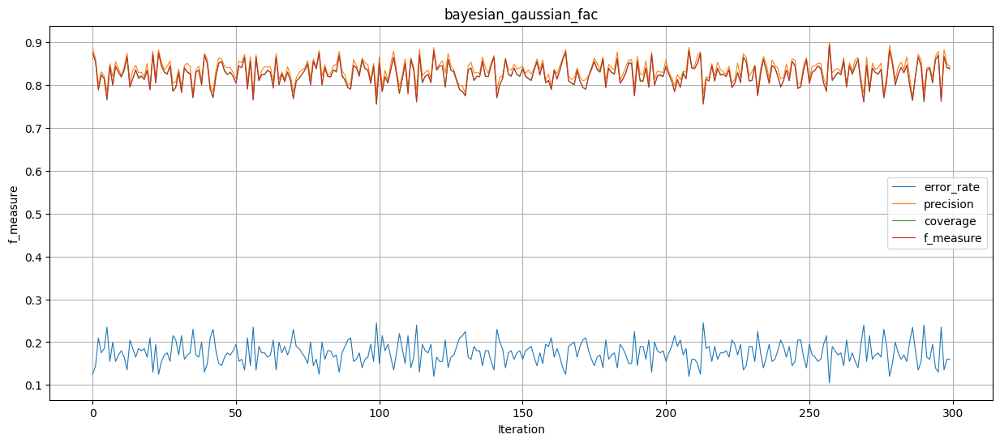

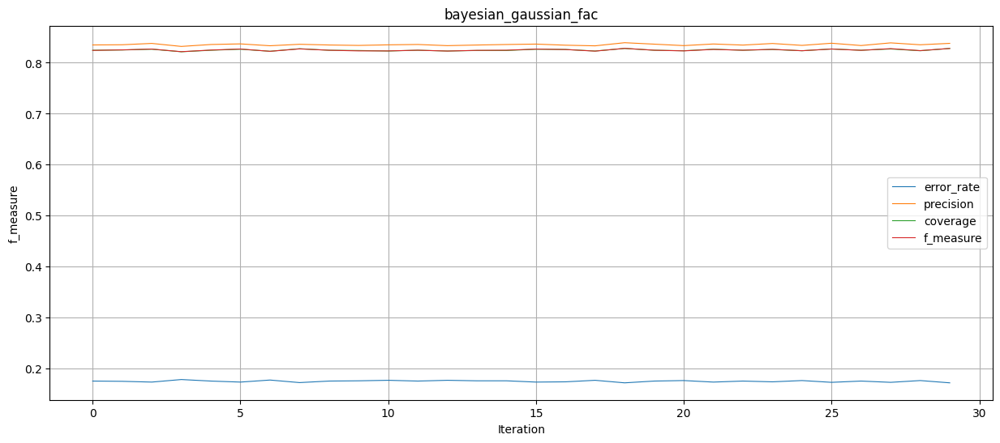

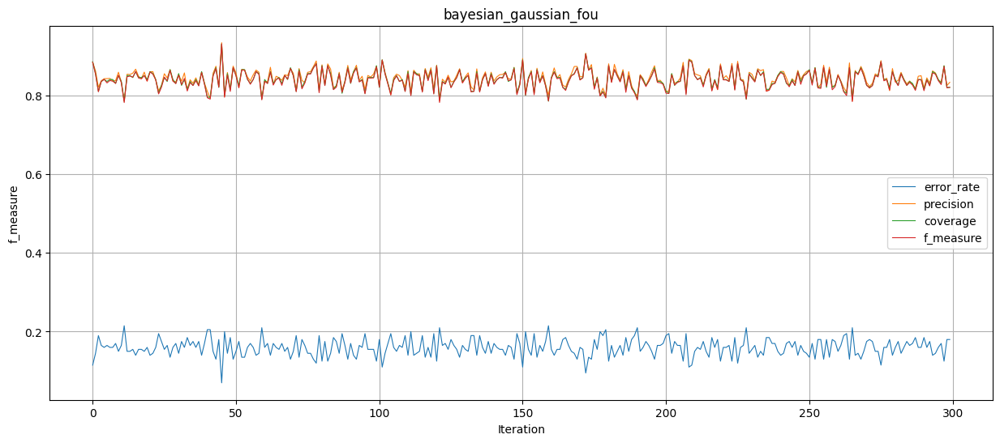

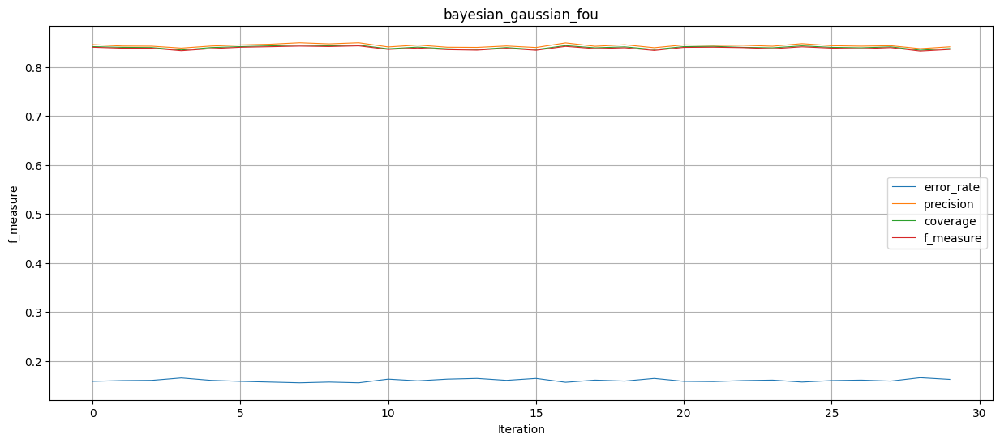

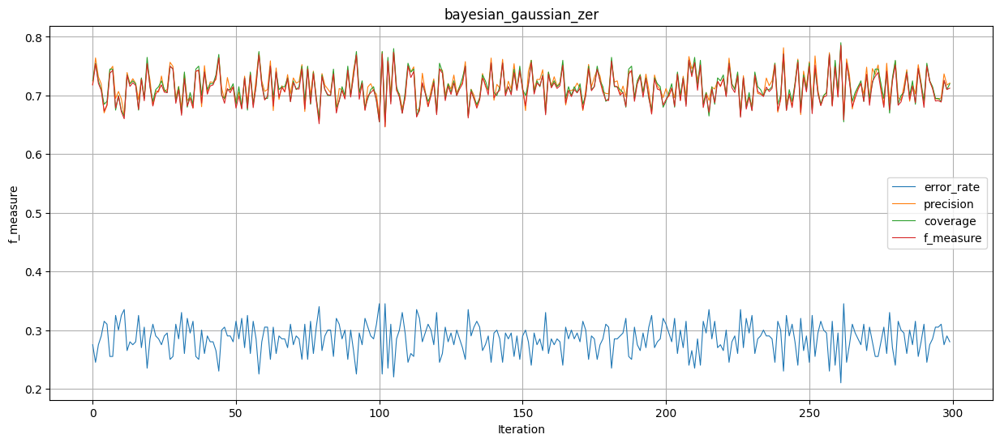

...

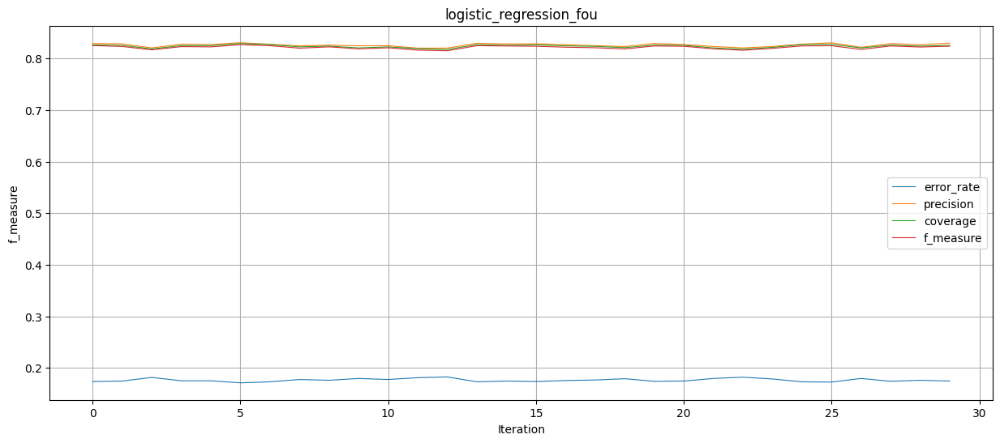

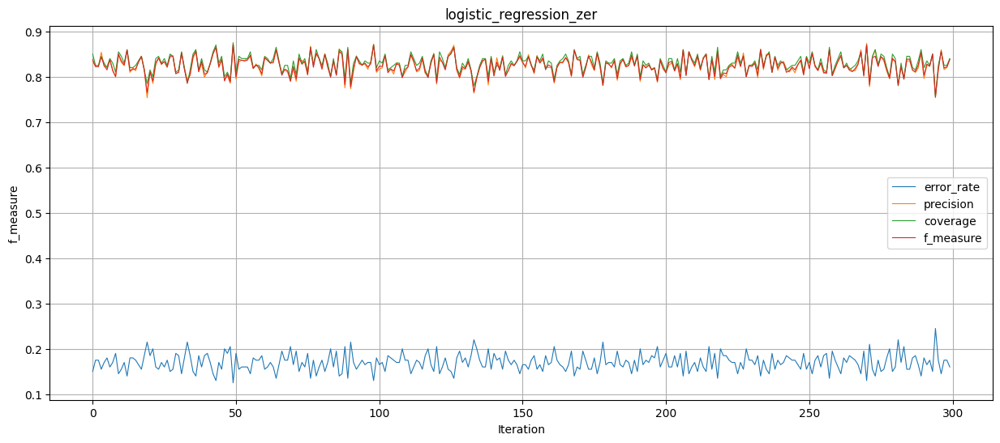

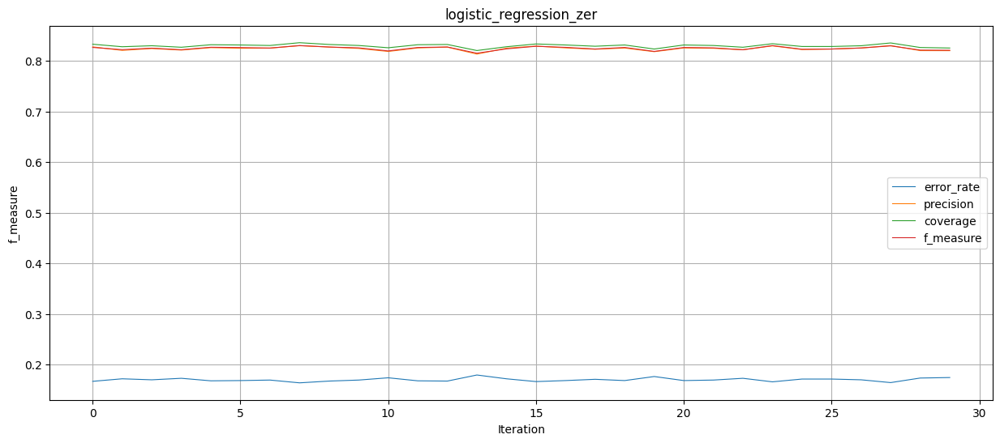

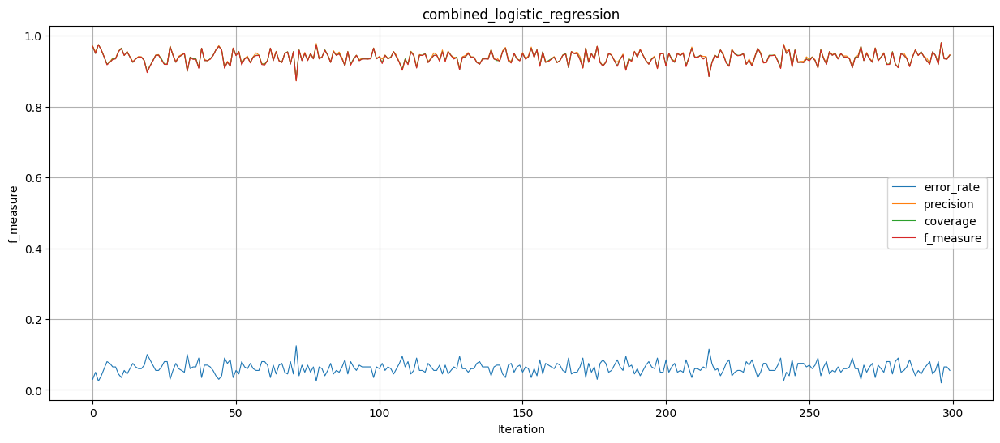

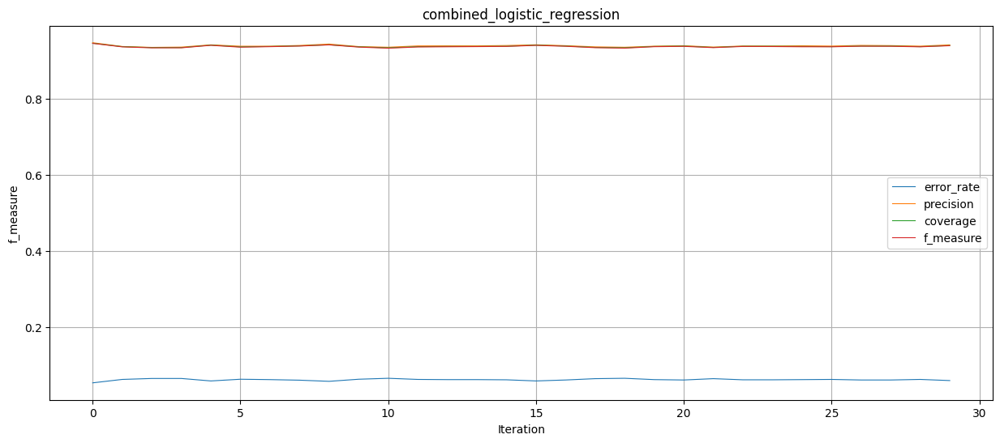

In [41]:
with open("metrics.json", "r") as outfile:
    full_metrics = json.load(outfile)
flattened_data = [entry for sublist in full_metrics for entry in sublist]

# Extracting metrics for each model from the flattened data
models = list(flattened_data[0].keys())
metrics = list(flattened_data[0][models[0]].keys())

# Reinitializing model_metrics based on the flattened structure
model_metrics = {model: {metric: [] for metric in metrics} for model in models}

# Populating the dictionary with metric values from the flattened data
for entry in flattened_data:
    for model in models:
        for metric in metrics:
            model_metrics[model][metric].append(entry[model][metric])

# Plotting the error_rate for each model

for model in models:
    plt.figure(figsize=(15,6))
    for metric in metrics:
        plt.plot(model_metrics[model][metric], label=metric,lw=0.8)
    plt.xlabel("Iteration")
    plt.ylabel(metric)
    plt.legend()
    plt.title(model)
    plt.grid(True)
    plt.show()
    plt.figure(figsize=(15,6))
    for metric in metrics:
        plt.plot(mean_values[model][metric], label=metric,lw=0.8)
    plt.xlabel("Iteration")
    plt.ylabel(metric)
    plt.legend()
    plt.title(model)
    plt.grid(True)
    plt.show()

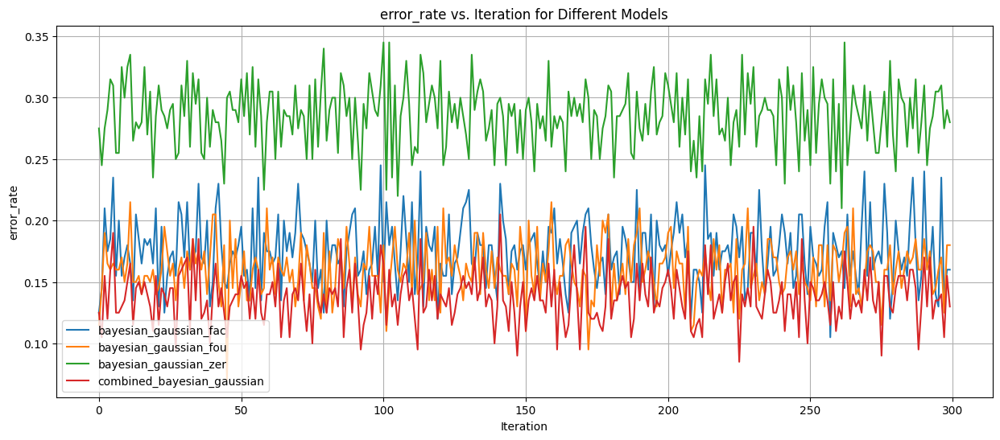

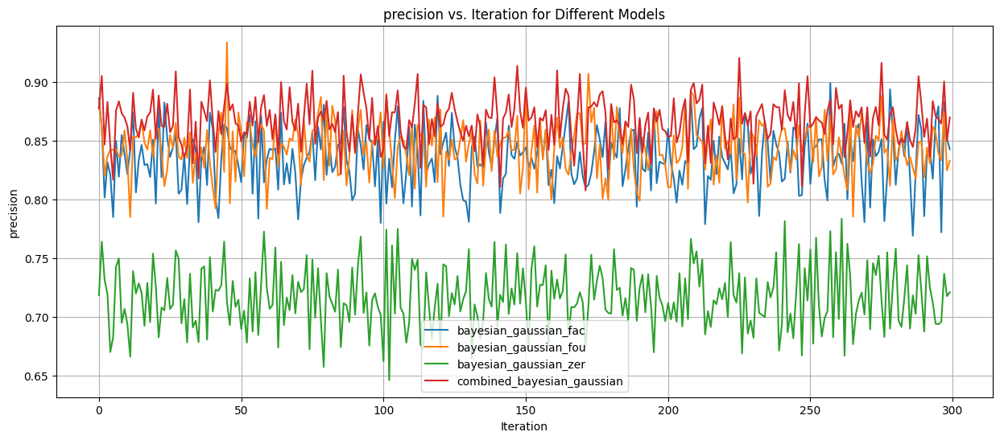

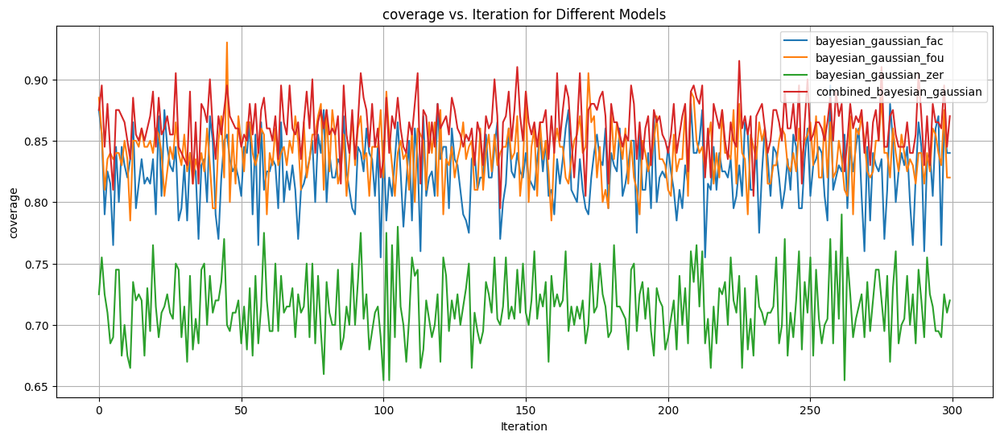

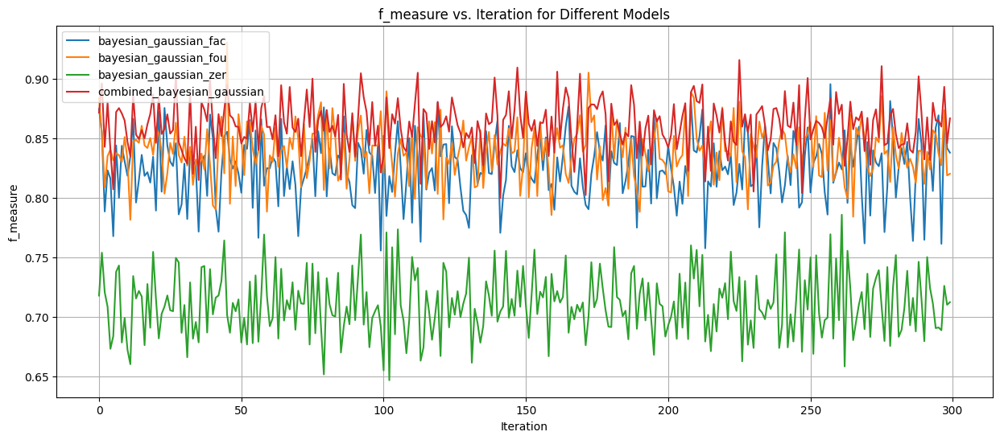

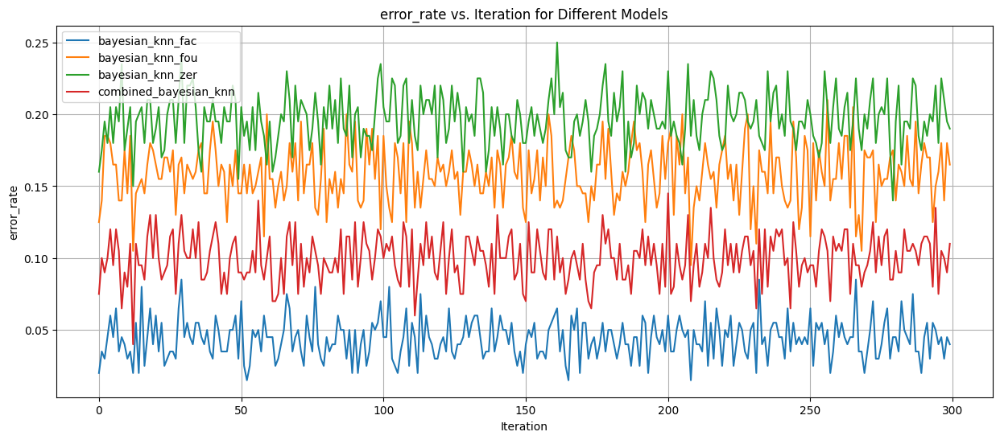

...

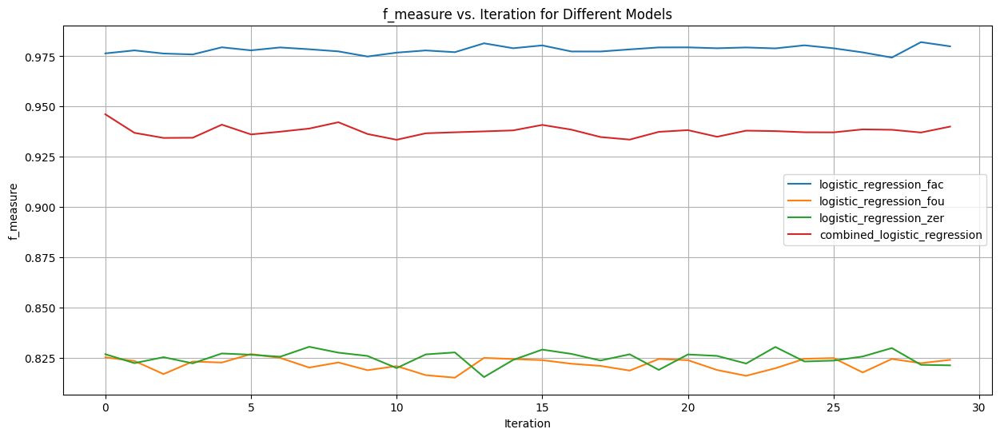

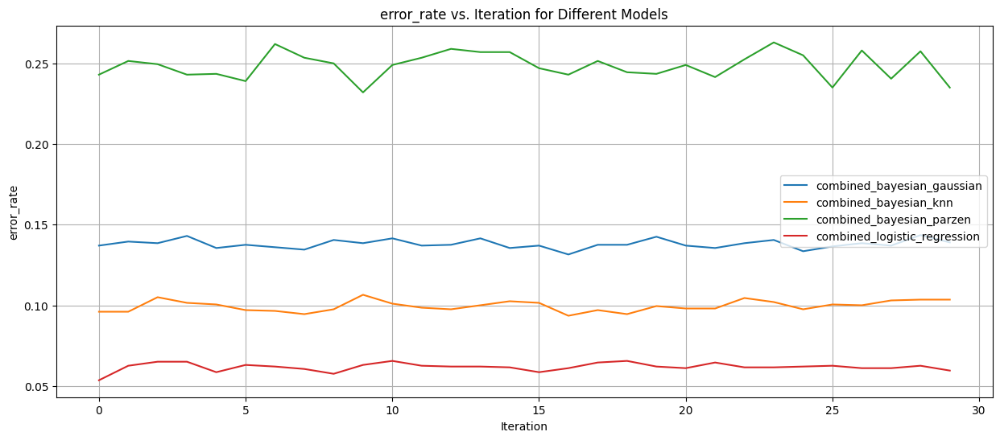

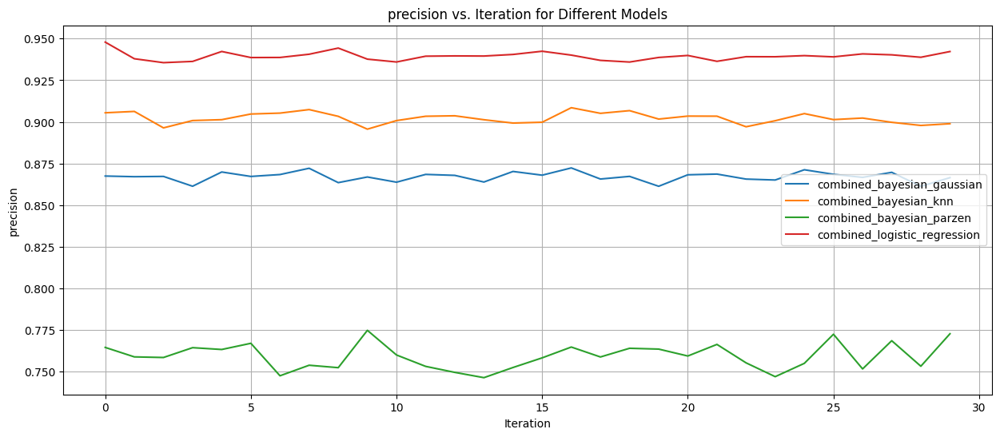

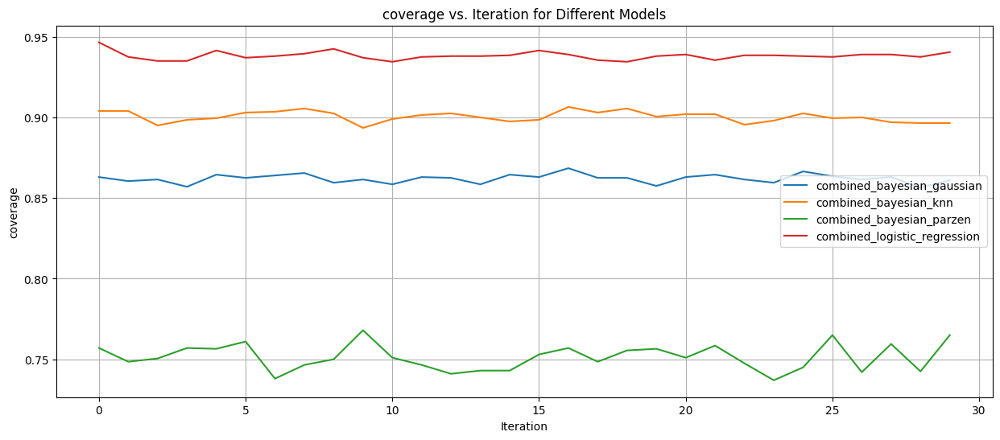

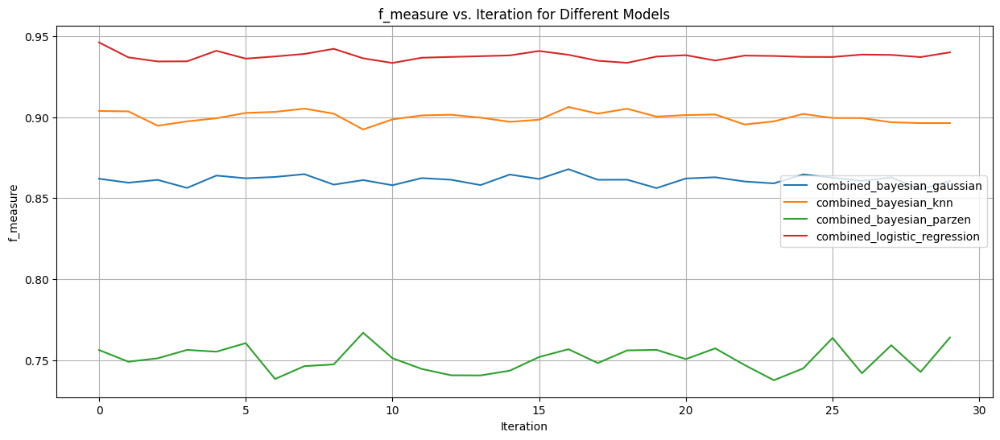

In [42]:
flattened_data = [entry for sublist in full_metrics for entry in sublist]

# Extracting metrics for each model from the flattened data
models = list(flattened_data[0].keys())
metrics = list(flattened_data[0][models[0]].keys())

# Reinitializing model_metrics based on the flattened structure
model_metrics = {model: {metric: [] for metric in metrics} for model in models}

# Populating the dictionary with metric values from the flattened data
for entry in flattened_data:
    for model in models:
        for metric in metrics:
            model_metrics[model][metric].append(entry[model][metric])

def plot_per_metric(model_metrics,model_name,metric): 
    # Plotting the error_rate for each model
    plt.figure(figsize=(15, 6))
    for model in models:
        if model_name in model:
            plt.plot(model_metrics[model][metric], label=model)

    plt.xlabel("Iteration")
    plt.ylabel(metric)
    plt.title(f"{metric} vs. Iteration for Different Models")
    plt.legend()
    plt.grid(True)
    plt.show()

for metric in metrics:
    plot_per_metric(model_metrics,'gaussian',metric)
for metric in metrics:
    plot_per_metric(model_metrics,'knn',metric)
for metric in metrics:
    plot_per_metric(model_metrics,'parzen',metric)
for metric in metrics:
    plot_per_metric(model_metrics,'logistic',metric)
for metric in metrics:
    plot_per_metric(model_metrics,'combined',metric)
for metric in metrics:
    plot_per_metric(mean_values,'gaussian',metric)
for metric in metrics:
    plot_per_metric(mean_values,'knn',metric)
for metric in metrics:
    plot_per_metric(mean_values,'parzen',metric)
for metric in metrics:
    plot_per_metric(mean_values,'logistic',metric)
for metric in metrics:
    plot_per_metric(mean_values,'combined',metric)

In [12]:
# Calculate the mean value for each metric for each kfold in each training

# Get the model names and metrics names from the sample data
model_names = list(sample_data[0].keys())
metric_names = list(sample_data[0][model_names[0]].keys())

# Create a dictionary to store the mean values for each training for each model for each metric
mean_values = {model: {metric: [] for metric in metric_names} for model in model_names}

# Iterate over each training
for training in full_metrics:
    # Iterate over each model
    for model in model_names:
        # Calculate the mean value for each metric for the current model for the current training
        for metric in metric_names:
            mean_value = sum(kfold[model][metric] for kfold in training) / len(training)
            mean_values[model][metric].append(mean_value)



In [41]:
metric_names,model_names

(['error_rate', 'precision', 'coverage', 'f_measure'],
 ['bayesian_gaussian_fac',
  'bayesian_gaussian_fou',
  'bayesian_gaussian_zer',
  'combined_bayesian_gaussian',
  'bayesian_knn_fac',
  'bayesian_knn_fou',
  'bayesian_knn_zer',
  'combined_bayesian_knn',
  'bayesian_parzen_fac',
  'bayesian_parzen_fou',
  'bayesian_parzen_zer',
  'combined_bayesian_parzen',
  'logistic_regression_fac',
  'logistic_regression_fou',
  'logistic_regression_zer',
  'combined_logistic_regression'])

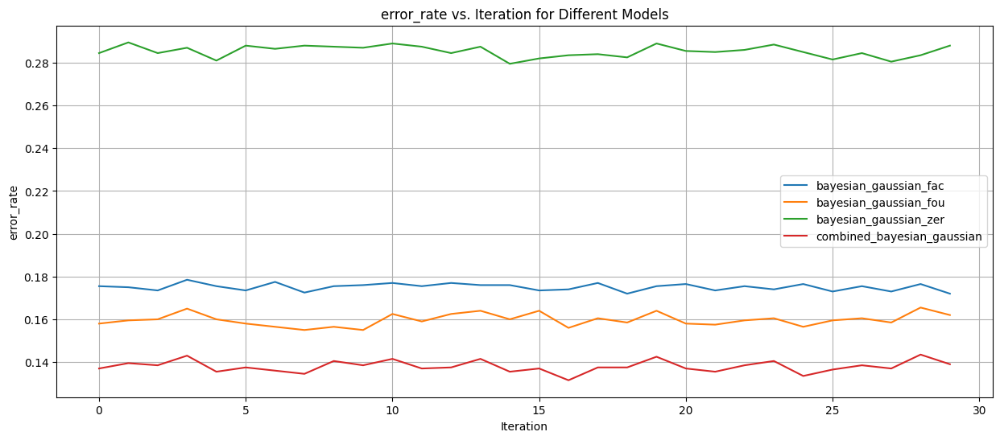

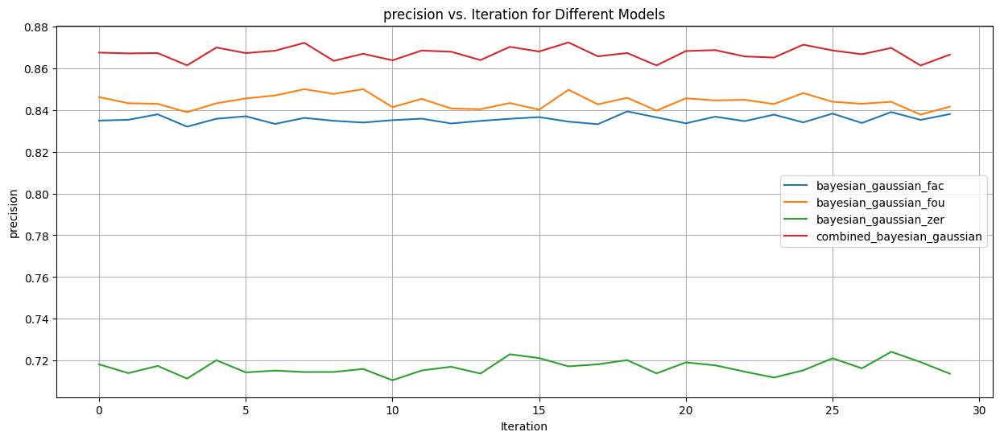

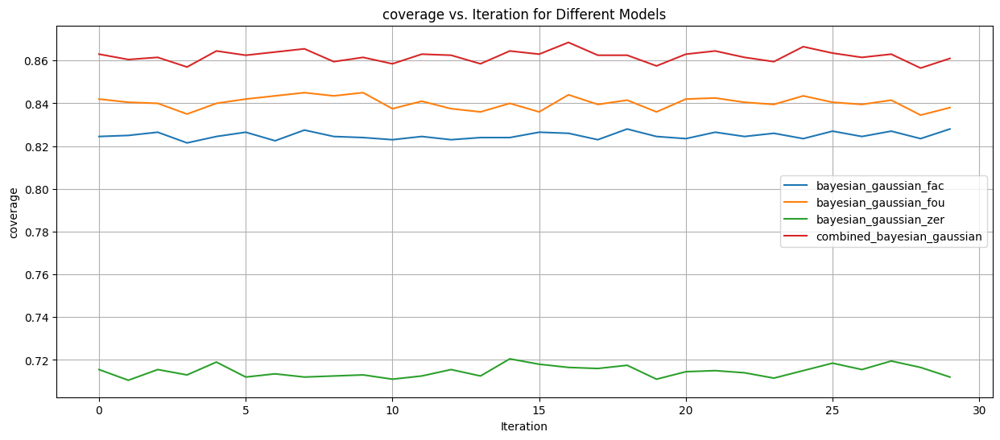

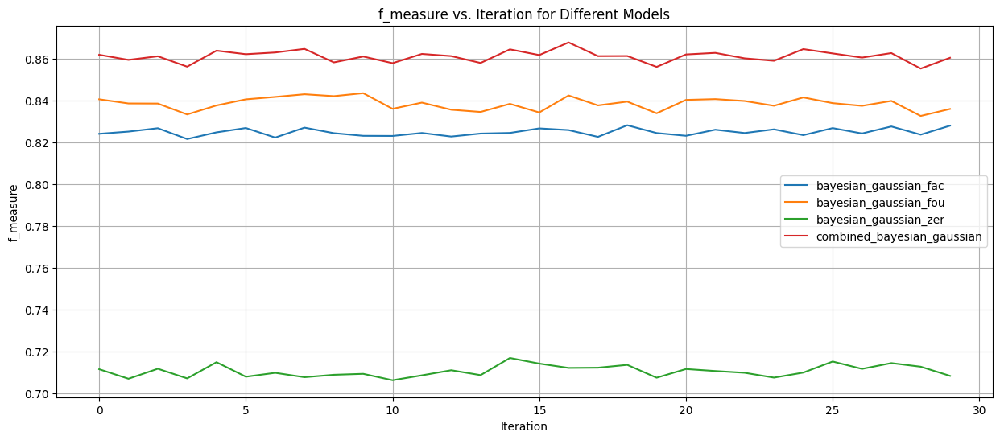

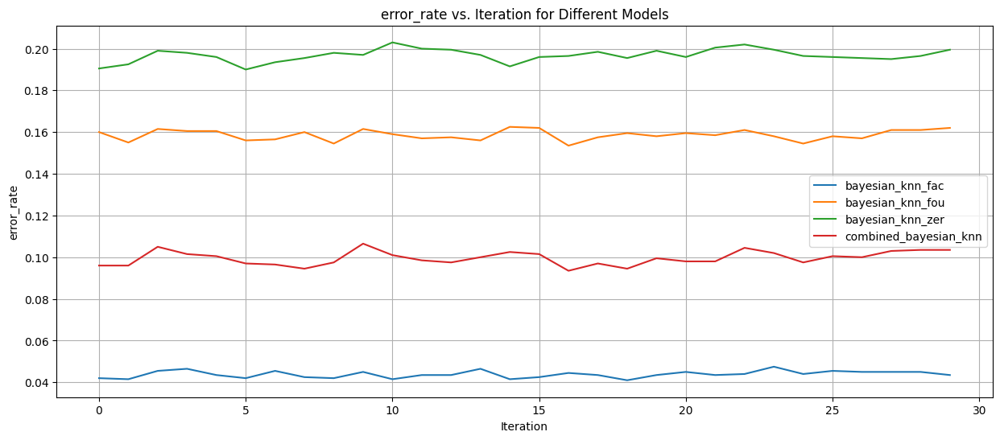

...

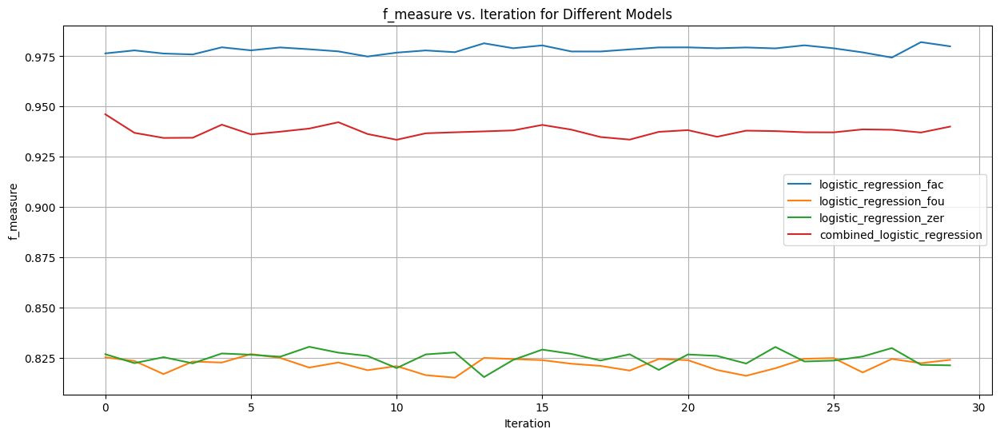

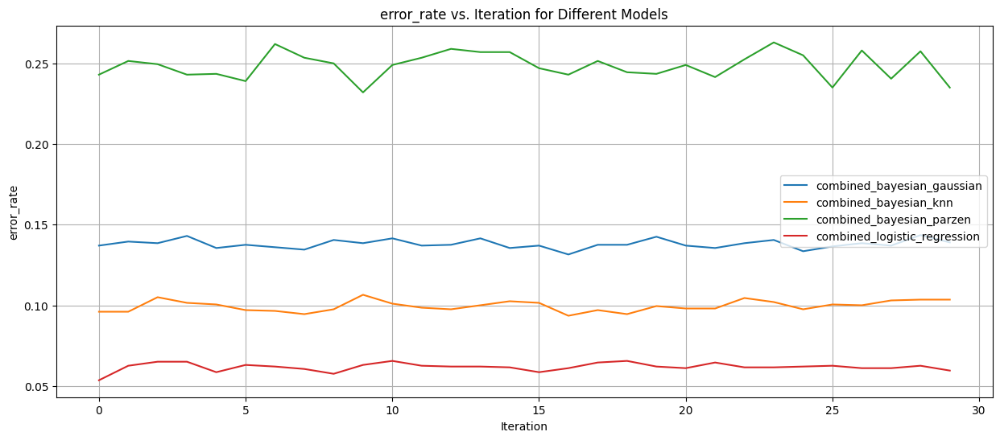

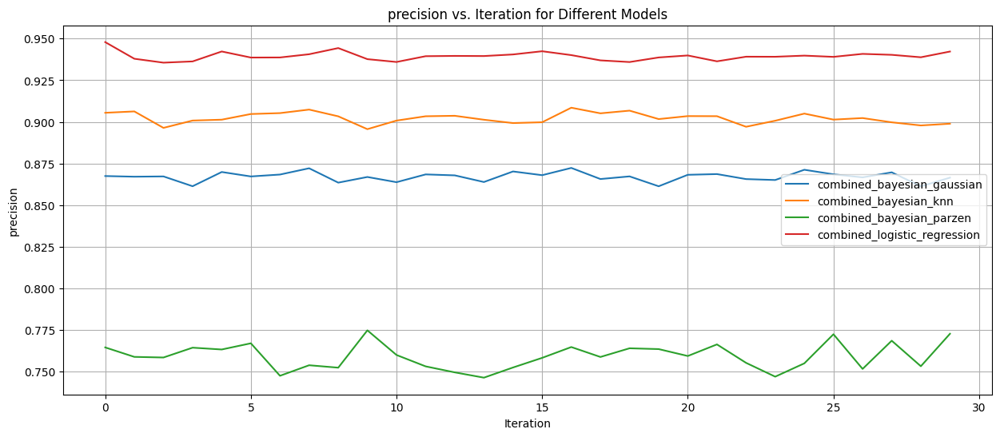

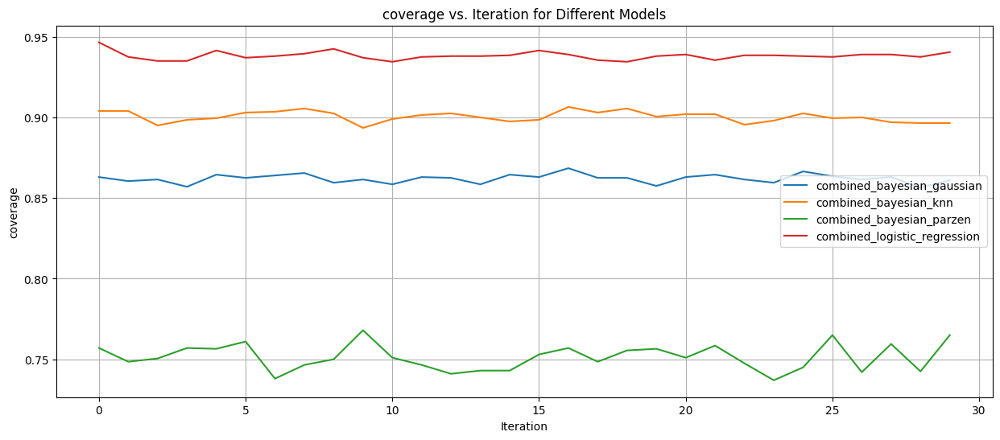

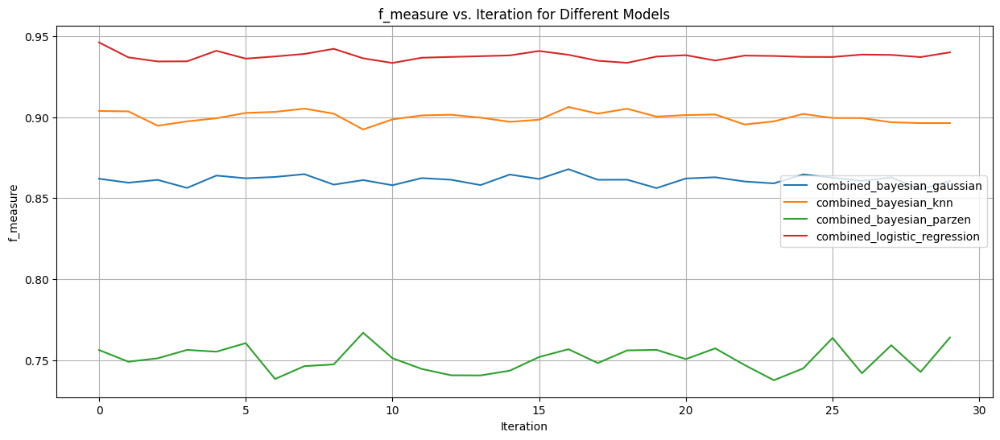

In [14]:
for metric in metrics:
    plot_per_metric(mean_values,'gaussian',metric)
for metric in metrics:
    plot_per_metric(mean_values,'knn',metric)
for metric in metrics:
    plot_per_metric(mean_values,'parzen',metric)
for metric in metrics:
    plot_per_metric(mean_values,'logistic',metric)
for metric in metrics:
    plot_per_metric(mean_values,'combined',metric)

In [43]:
import pandas as pd


In [27]:

model_names = list(sample_data[0].keys())
metric_names = list(sample_data[0][model_names[0]].keys())

# Create a dictionary to store the mean values for each training for each model for each metric
mean_values = {model: {metric: [] for metric in metric_names} for model in model_names}

# Iterate over each training
for training in full_metrics:
    # Iterate over each model
    for model in model_names:
        # Calculate the mean value for each metric for the current model for the current training
        for metric in metric_names:
            mean_value = sum(kfold[model][metric] for kfold in training) / len(training)
            mean_values[model][metric].append(mean_value)


print(mean_values)
# Adicione as médias às listas correspondentes
mean_metrics_dict = {metric: {classifier: mean_values[classifier][metric] for classifier in model_names} for metric in metric_names}
metrics_dict = {metric: {classifier: model_metrics[classifier][metric] for classifier in model_names} for metric in metric_names}

{'bayesian_gaussian_fac': {'error_rate': [0.17550000000000004, 0.17500000000000004, 0.17350000000000004, 0.17850000000000002, 0.17550000000000004, 0.1735, 0.1775, 0.17250000000000001, 0.1755, 0.176, 0.177, 0.17550000000000004, 0.177, 0.17600000000000005, 0.17600000000000002, 0.1735, 0.174, 0.177, 0.17200000000000001, 0.1755, 0.17650000000000002, 0.17350000000000002, 0.17550000000000002, 0.17400000000000002, 0.17650000000000002, 0.173, 0.17550000000000002, 0.173, 0.17650000000000002, 0.17200000000000001], 'precision': [0.8348964390120444, 0.8352774643381664, 0.8379054206733872, 0.8319889678990837, 0.835771845758009, 0.8369698564453847, 0.8333119435620142, 0.8361980987383566, 0.8348044874271763, 0.8339708139359632, 0.8351081325015342, 0.8358231269787989, 0.8335133173539703, 0.8347504861595183, 0.8357614612500706, 0.8365626129425874, 0.8344123469388679, 0.8331735344642851, 0.8393020524301852, 0.8364503582603099, 0.8335964580162731, 0.836762471177306, 0.8346344197239087, 0.8377503613096373

In [28]:
df_error_rate = pd.DataFrame(metrics_dict['error_rate'])
df_precision =pd.DataFrame(metrics_dict['coverage'])
df_coverage = pd.DataFrame(metrics_dict['precision'])
df_f_measure = pd.DataFrame(metrics_dict['f_measure'])
dfs = [df_error_rate,df_precision,df_coverage,df_f_measure]

In [27]:
df_error_rate = pd.DataFrame({
    'error_rate_bayesian_gaussian': error_rate_bayesian_gaussian,
    'error_rate_bayesian_knn': error_rate_bayesian_knn,
    'error_rate_bayesian_parzen': error_rate_bayesian_parzen,
    'error_rate_logistic_regression': error_rate_logistic_regression

})
df_precision = pd.DataFrame({
    'precision_bayesian_gaussian': precision_bayesian_gaussian,
    'precision_bayesian_knn': precision_bayesian_knn,
    'precision_bayesian_parzen': precision_bayesian_parzen,
    'precision_logistic_regression': precision_logistic_regression
})
df_coverage = pd.DataFrame({
    'coverage_bayesian_gaussian': coverage_bayesian_gaussian,
    'coverage_bayesian_knn': coverage_bayesian_knn,
    'coverage_bayesian_parzen': coverage_bayesian_parzen,
    'coverage_logistic_regression': coverage_logistic_regression
})
df_f_measure = pd.DataFrame({
    'f_measure_bayesian_gaussian': f_measure_bayesian_gaussian,
    'f_measure_bayesian_knn': f_measure_bayesian_knn,
    'f_measure_bayesian_parzen': f_measure_bayesian_parzen,
    'f_measure_logistic_regression': f_measure_logistic_regression
})
dfs = [df_error_rate,df_precision,df_coverage,df_f_measure]

In [29]:
df_all_metrics = pd.DataFrame({
    'error_rate_bayesian_gaussian': error_rate_bayesian_gaussian,
    'precision_bayesian_gaussian': precision_bayesian_gaussian,
    'coverage_bayesian_gaussian': coverage_bayesian_gaussian,
    'f_measure_bayesian_gaussian': f_measure_bayesian_gaussian,
    'error_rate_bayesian_knn': error_rate_bayesian_knn,
    'precision_bayesian_knn': precision_bayesian_knn,
    'coverage_bayesian_knn': coverage_bayesian_knn,
    'f_measure_bayesian_knn': f_measure_bayesian_knn,
    'error_rate_bayesian_parzen': error_rate_bayesian_parzen,
    'precision_bayesian_parzen': precision_bayesian_parzen,
    'coverage_bayesian_parzen': coverage_bayesian_parzen,
    'f_measure_bayesian_parzen': f_measure_bayesian_parzen,
    'error_rate_logistic_regression': error_rate_logistic_regression,
    'precision_logistic_regression': precision_logistic_regression,
    'coverage_logistic_regression': coverage_logistic_regression,
    'f_measure_logistic_regression': f_measure_logistic_regression
})
df_all_metrics

,error_rate_bayesian_gaussian,precision_bayesian_gaussian,coverage_bayesian_gaussian,f_measure_bayesian_gaussian,error_rate_bayesian_knn,precision_bayesian_knn,coverage_bayesian_knn,f_measure_bayesian_knn,error_rate_bayesian_parzen,precision_bayesian_parzen,coverage_bayesian_parzen,f_measure_bayesian_parzen,error_rate_logistic_regression,precision_logistic_regression,coverage_logistic_regression,f_measure_logistic_regression
0,0.1370,0.867460,0.8630,0.861938,0.0935,0.908177,0.9065,0.906346,0.2635,0.745048,0.7365,0.736791,0.0575,0.943958,0.9425,0.942065
1,0.1395,0.867075,0.8605,0.859493,0.0995,0.902509,0.9005,0.899810,0.2595,0.748983,0.7405,0.739755,0.0565,0.944419,0.9435,0.943112
2,0.1385,0.867234,0.8615,0.861228,0.1045,0.897242,0.8955,0.895480,0.2610,0.749362,0.7390,0.739678,0.0630,0.938349,0.9370,0.936578
3,0.1430,0.861345,0.8570,0.856256,0.1005,0.902907,0.8995,0.898284,0.2645,0.740786,0.7355,0.733212,0.0640,0.938179,0.9360,0.935797
4,0.1355,0.869888,0.8645,0.863898,0.0980,0.904244,0.9020,0.901896,0.2610,0.750492,0.7390,0.739537,0.0605,0.941149,0.9395,0.939084
5,0.1375,0.867219,0.8625,0.862214,0.1010,0.901121,0.8990,0.898583,0.2575,0.753706,0.7425,0.743179,0.0640,0.938607,0.9360,0.935177
6,0.1360,0.868364,0.8640,0.863032,0.0960,0.905822,0.9040,0.903547,0.2725,0.739951,0.7275,0.729223,0.0615,0.939375,0.9385,0.938268
7,0.1345,0.872126,0.8655,0.864755,0.0980,0.904168,0.9020,0.901741,0.2645,0.747323,0.7355,0.736965,0.0595,0.941768,0.9405,0.940118
8,0.1405,0.863503,0.8595,0.858299,0.0940,0.908750,0.9060,0.905403,0.2745,0.735011,0.7255,0.725588,0.0580,0.943796,0.9420,0.941609
9,0.1385,0.866895,0.8615,0.861103,0.1025,0.900143,0.8975,0.896834,0.2550,0.752738,0.7450,0.744204,0.0570,0.943707,0.9430,0.942754


In [29]:
dfs[0]

,bayesian_gaussian_fac,bayesian_gaussian_fou,bayesian_gaussian_zer,combined_bayesian_gaussian,bayesian_knn_fac,bayesian_knn_fou,bayesian_knn_zer,combined_bayesian_knn,bayesian_parzen_fac,bayesian_parzen_fou,bayesian_parzen_zer,combined_bayesian_parzen,logistic_regression_fac,logistic_regression_fou,logistic_regression_zer,combined_logistic_regression
0,0.125,0.115,0.275,0.125,0.020,0.125,0.160,0.075,0.360,0.415,0.230,0.225,0.000,0.135,0.150,0.030
1,0.145,0.145,0.245,0.105,0.035,0.140,0.175,0.100,0.240,0.445,0.230,0.195,0.015,0.195,0.175,0.050
2,0.210,0.190,0.275,0.155,0.030,0.185,0.195,0.090,0.290,0.395,0.245,0.220,0.010,0.160,0.175,0.025
3,0.175,0.165,0.290,0.120,0.045,0.185,0.180,0.100,0.365,0.465,0.260,0.275,0.015,0.185,0.155,0.040
4,0.185,0.160,0.315,0.160,0.060,0.180,0.205,0.120,0.380,0.425,0.265,0.255,0.035,0.175,0.170,0.060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,0.130,0.160,0.305,0.135,0.040,0.160,0.180,0.075,0.280,0.425,0.245,0.225,0.030,0.190,0.175,0.080
296,0.235,0.170,0.310,0.140,0.045,0.180,0.225,0.105,0.305,0.470,0.265,0.220,0.010,0.140,0.145,0.020
297,0.135,0.125,0.275,0.105,0.030,0.140,0.210,0.100,0.365,0.455,0.260,0.240,0.025,0.200,0.175,0.065
298,0.160,0.180,0.290,0.155,0.045,0.180,0.195,0.090,0.320,0.425,0.290,0.230,0.010,0.195,0.175,0.065


In [35]:
import scipy.stats as stats
metric_names
# Suponha que metrics seja um DataFrame do pandas contendo suas métricas
for i in range(len(dfs)):
    print(*[col for col in dfs[i].columns])
    friedman_statistic, p_value = stats.friedmanchisquare(*[df[col] for col in dfs[i].columns])
    print('All classifiers',metric_names[i],friedman_statistic,p_value)
    print(*[col for col in dfs[i].columns if 'combined' in col])
    friedman_statistic, p_value = stats.friedmanchisquare(*[df[col] for col in dfs[i].columns if 'combined' in col])
    print('Combined only: ',metric_names[i],friedman_statistic,p_value)
# friedman_statistic, p_value = stats.friedmanchisquare(*[df_all_metrics[col] for col in df_all_metrics.columns])
# friedman_statistic, p_value

bayesian_gaussian_fac bayesian_gaussian_fou bayesian_gaussian_zer combined_bayesian_gaussian bayesian_knn_fac bayesian_knn_fou bayesian_knn_zer combined_bayesian_knn bayesian_parzen_fac bayesian_parzen_fou bayesian_parzen_zer combined_bayesian_parzen logistic_regression_fac logistic_regression_fou logistic_regression_zer combined_logistic_regression
All classifiers error_rate 446.8470588235293 9.513973991745197e-86
combined_bayesian_gaussian combined_bayesian_knn combined_bayesian_parzen combined_logistic_regression
Combined only:  error_rate 90.0 2.190570119285308e-19
bayesian_gaussian_fac bayesian_gaussian_fou bayesian_gaussian_zer combined_bayesian_gaussian bayesian_knn_fac bayesian_knn_fou bayesian_knn_zer combined_bayesian_knn bayesian_parzen_fac bayesian_parzen_fou bayesian_parzen_zer combined_bayesian_parzen logistic_regression_fac logistic_regression_fou logistic_regression_zer combined_logistic_regression
All classifiers precision 446.8470588235293 9.513973991745197e-86
combin

In [36]:
import scikit_posthocs as sp

# O resultado é uma matriz de p-valores
nemenyi_results = []
for df in dfs:
    nemenyi_results.append(sp.posthoc_nemenyi_friedman(df))
# nemenyi_results_all_metrics = sp.posthoc_nemenyi_friedman(df_all_metrics)

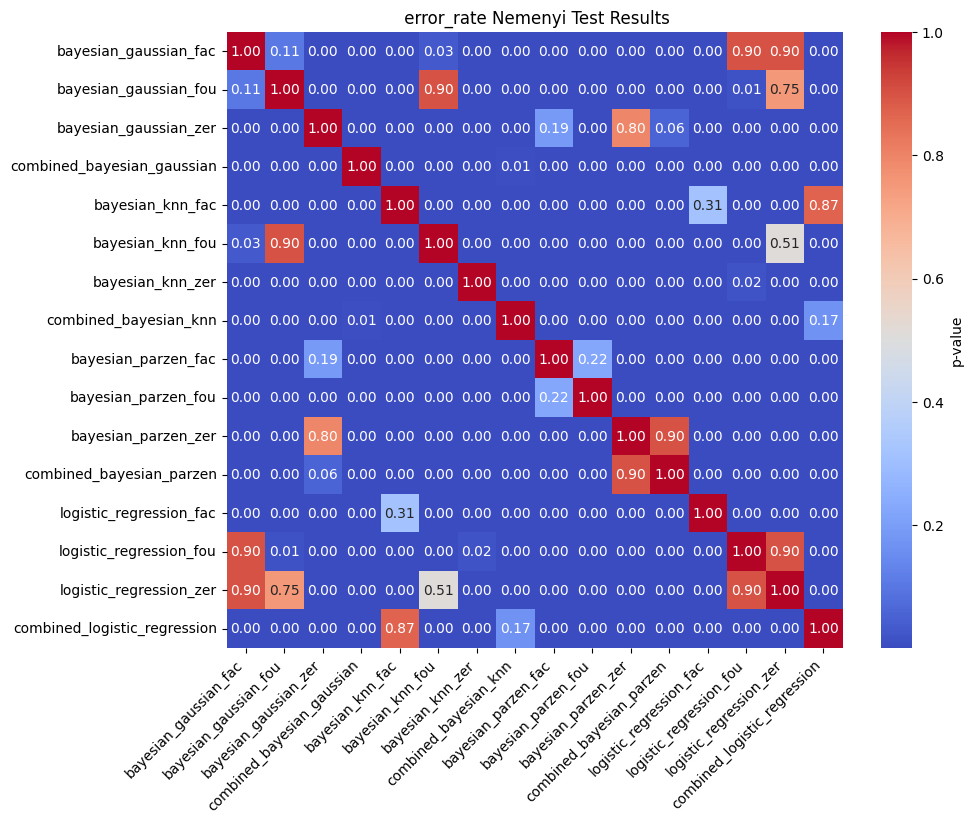

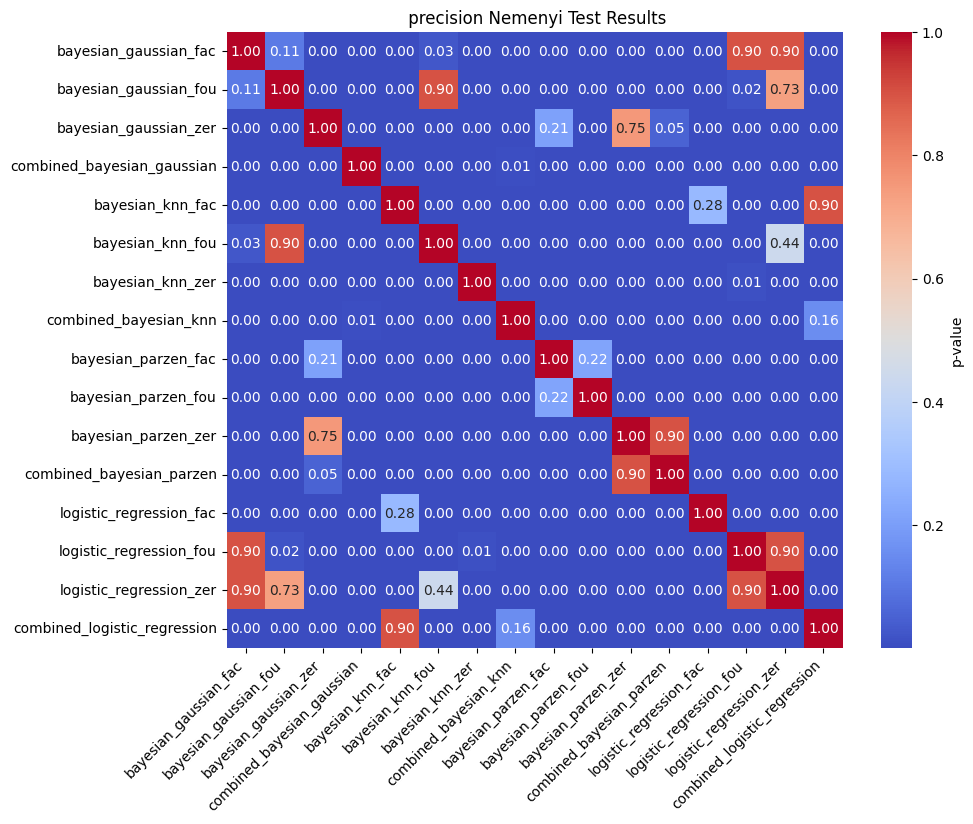

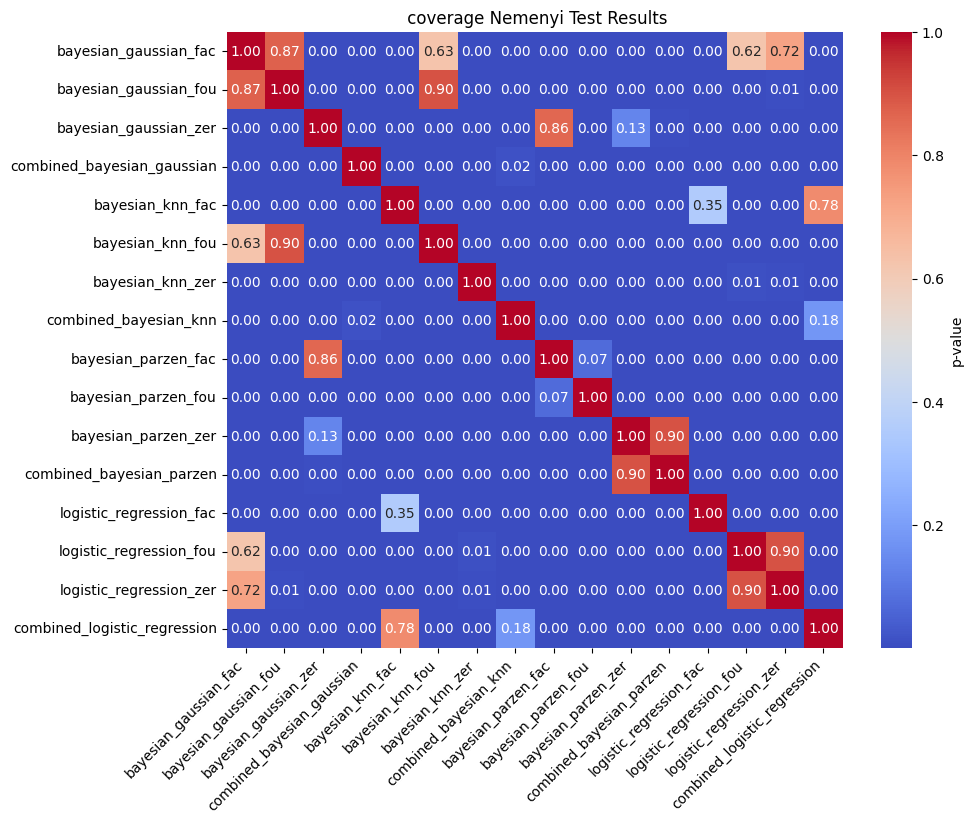

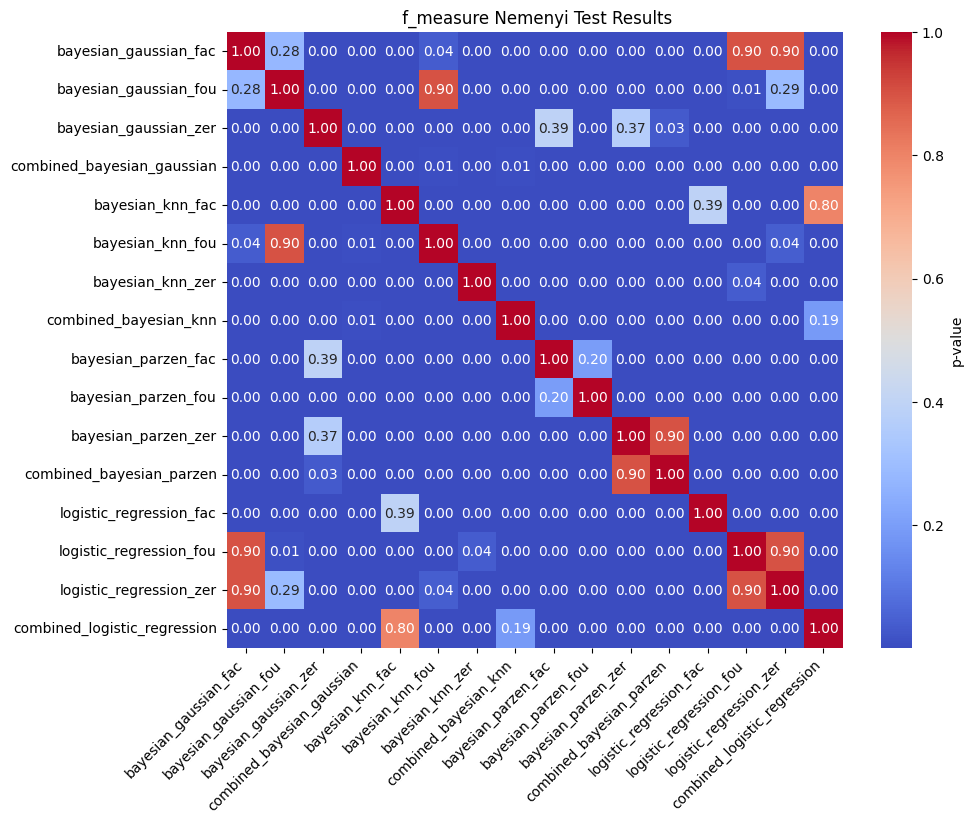

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

for i in range(len(nemenyi_results)):
    # Suponha que nemenyi_results seja o DataFrame que você obteve do teste de Nemenyi
    plt.figure(figsize=(10, 8))  # Ajuste o tamanho da figura conforme necessário
    sns.heatmap(nemenyi_results[i], annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={'label': 'p-value'})
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.title(f' {metric_names[i]} Nemenyi Test Results')
    plt.show()


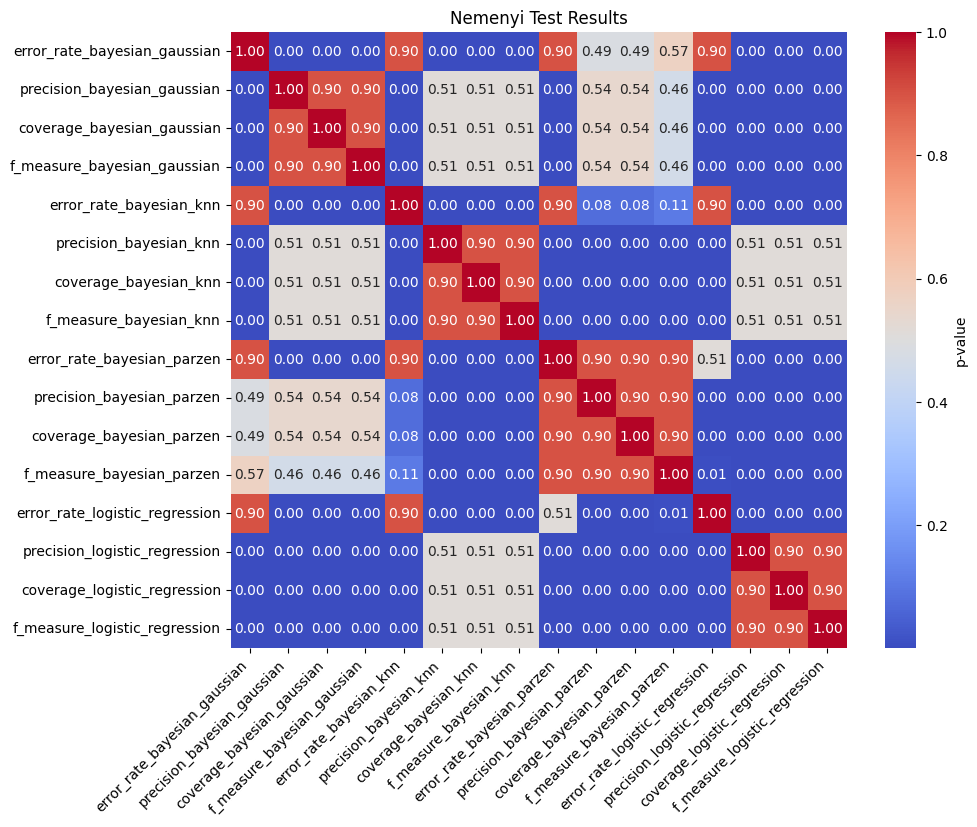

In [ ]:
# Suponha que nemenyi_results seja o DataFrame que você obteve do teste de Nemenyi
plt.figure(figsize=(10, 8))  # Ajuste o tamanho da figura conforme necessário
sns.heatmap(nemenyi_results_all_metrics, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={'label': 'p-value'})
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('Nemenyi Test Results')
plt.show()

# Cálculo dos intervalos de confiança

In [36]:
NIVEL_CONFIANCA = 0.95
CLASSIFIERS = [ 
    "bayesian_gaussian_fac",
    "bayesian_gaussian_fou",
    "bayesian_gaussian_zer",
    "combined_bayesian_gaussian",
    "bayesian_knn_fac",
    "bayesian_knn_fou",
    "bayesian_knn_zer",
    "combined_bayesian_knn",
    "bayesian_parzen_fac",
    "bayesian_parzen_fou",
    "bayesian_parzen_zer",
    "combined_bayesian_parzen",
    "logistic_regression_fac",
    "logistic_regression_fou",
    "logistic_regression_zer",
    "combined_logistic_regression"
]
METRICS = [ 'error_rate', 'precision', 'coverage', 'f_measure']

def calcular_intervalo_de_confiança(nivel_confianca: float, dados: list[float]):
    media = np.mean(dados)
    limite_inferior, limite_superior = stats.t.interval(nivel_confianca, len(dados) - 1, loc=media, scale=stats.sem(dados))
    return (media, max(media - limite_inferior, limite_superior - media))

flat_map = lambda f, xs: [y for ys in xs for y in f(ys)]

def extract_classifier_metrics(classifier_name: str, metric_name: str):
    return flat_map(lambda iteration_folds : [fold[classifier_name][metric_name] for fold in iteration_folds], metrics)

with open("metrics.json") as metrics_file:
    metrics = json.loads(metrics_file.read())

    for classifier in CLASSIFIERS:
        print(f"-----{classifier}-----")
        for metric in METRICS:
            media, valor = calcular_intervalo_de_confiança(NIVEL_CONFIANCA, extract_classifier_metrics(classifier, metric))
            print(f"O intervalo de confiança para {metric} é {media:.3f} ± {valor:.3f}")
        print("")

-----bayesian_gaussian_fac-----
O intervalo de confiança para error_rate é 0.175 ± 0.003
O intervalo de confiança para precision é 0.836 ± 0.003
O intervalo de confiança para coverage é 0.825 ± 0.003
O intervalo de confiança para f_measure é 0.825 ± 0.003

-----bayesian_gaussian_fou-----
O intervalo de confiança para error_rate é 0.160 ± 0.003
O intervalo de confiança para precision é 0.844 ± 0.003
O intervalo de confiança para coverage é 0.840 ± 0.003
O intervalo de confiança para f_measure é 0.839 ± 0.003

-----bayesian_gaussian_zer-----
O intervalo de confiança para error_rate é 0.285 ± 0.003
O intervalo de confiança para precision é 0.717 ± 0.003
O intervalo de confiança para coverage é 0.715 ± 0.003
O intervalo de confiança para f_measure é 0.711 ± 0.003

-----combined_bayesian_gaussian-----
O intervalo de confiança para error_rate é 0.138 ± 0.002
O intervalo de confiança para precision é 0.867 ± 0.002
O intervalo de confiança para coverage é 0.862 ± 0.002
O intervalo de confiança